# Lab 3 Image Processing

### **This notebook is for classifying colors in an image and retrieving the required information such as classified color names and an area with those colors in the image. **


The image used in the code is a part of sky, which is captured from the spaceneedle Panocam (https://www.spaceneedle.com/webcam ) at 1PM everyday. 

For the task, we use PIL (Python Image Library) to find 10 most dominant colors and the number of the color pixels. It returns color value in RGB. 

To normalize the color occupation of an image, we will map a percentage of an area by each color 

Your tasks:
1. Classify your 30 images into 10 most dominant colors.
2. Retrieve those color values and the number of pixels occupied by the color in the image.
3. Often a chart requires color values in hex instead of RGB. You convert the color value in hex and keep it in your data set.
4. We will map a percentage of a color oppcupied area instead of the pixel number to compare the images properly. (Normalization) Calculate the percentage and add it to your data set.

** Your final dataframe should include date (an image was taken), RGB, HEX, area in percentage 


*** For your convenience, write and download data in csv. Otherwise you will repeat the process endlessly.



### connect your google drive folder


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Install PIL

In [ ]:
pip install Pillow


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


### Import Image module
### Open an image. Replace your image file path.

In [ ]:
from PIL import Image
im = Image.open("/content/drive/MyDrive/Colab Notebooks/image/1.jpeg")

In [ ]:
for i in range(30):
  index = i + 1
  im = Image.open("/content/drive/MyDrive/Colab Notebooks/image/" + str(index) + ".jpeg")
  result = im.convert('P', palette=Image.ADAPTIVE, colors=10)
  result.save("/content/drive/MyDrive/Colab Notebooks/image/result" + str(30 - index + 1) + ".png")


### Retrieve some basic information of the image such as format, size, and mode

In [ ]:
print(im.format, im.size, im.mode)

JPEG (2732, 2714) RGB


### Take a look at your image and confirm it is the right one to process.

In [ ]:
im.show

<bound method Image.show of <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=2732x2714 at 0x7F317562BBB0>>

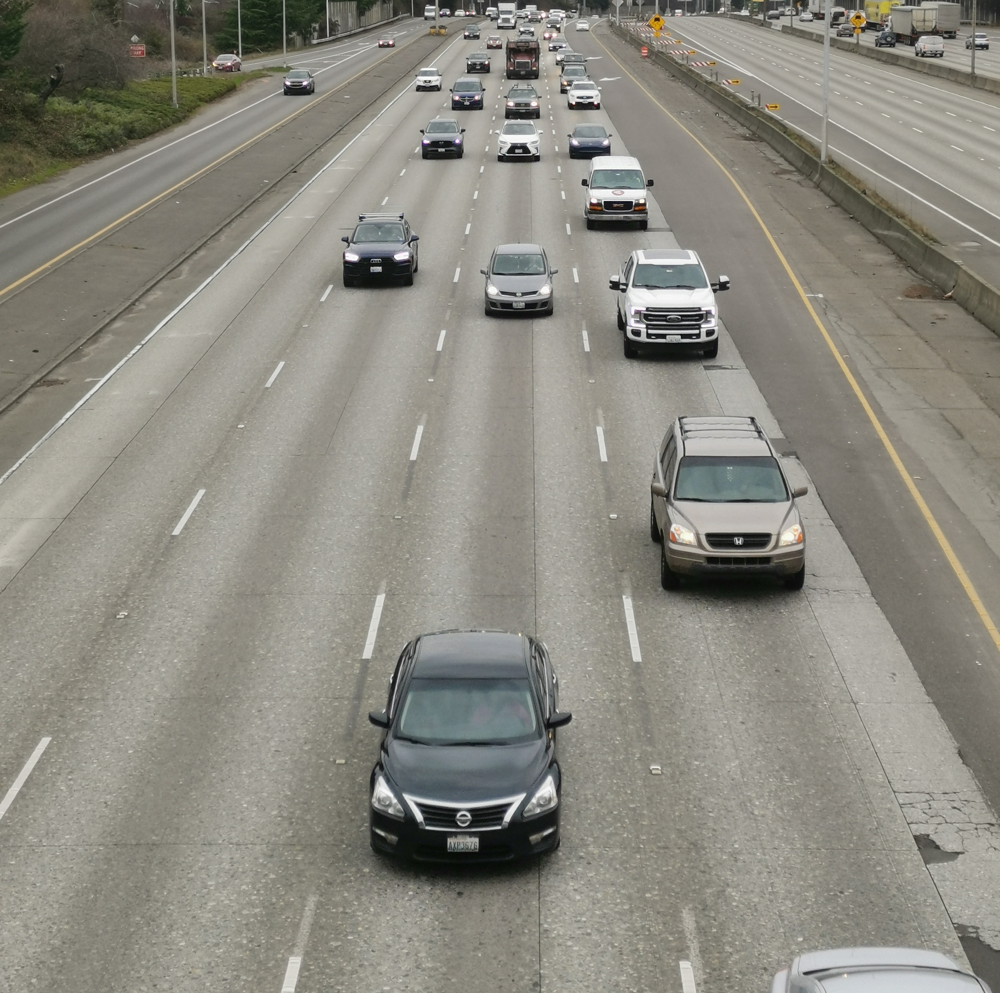

In [ ]:
im

### with im.convert, it will classify your image in 10 most dominant colors in P mode (upto 256 colors) and store an output in result.

In [ ]:
result = im.convert('P', palette=Image.ADAPTIVE, colors=10)

In [ ]:
result.show

<bound method Image.show of <PIL.Image.Image image mode=P size=2732x2714 at 0x7F31558ACA60>>

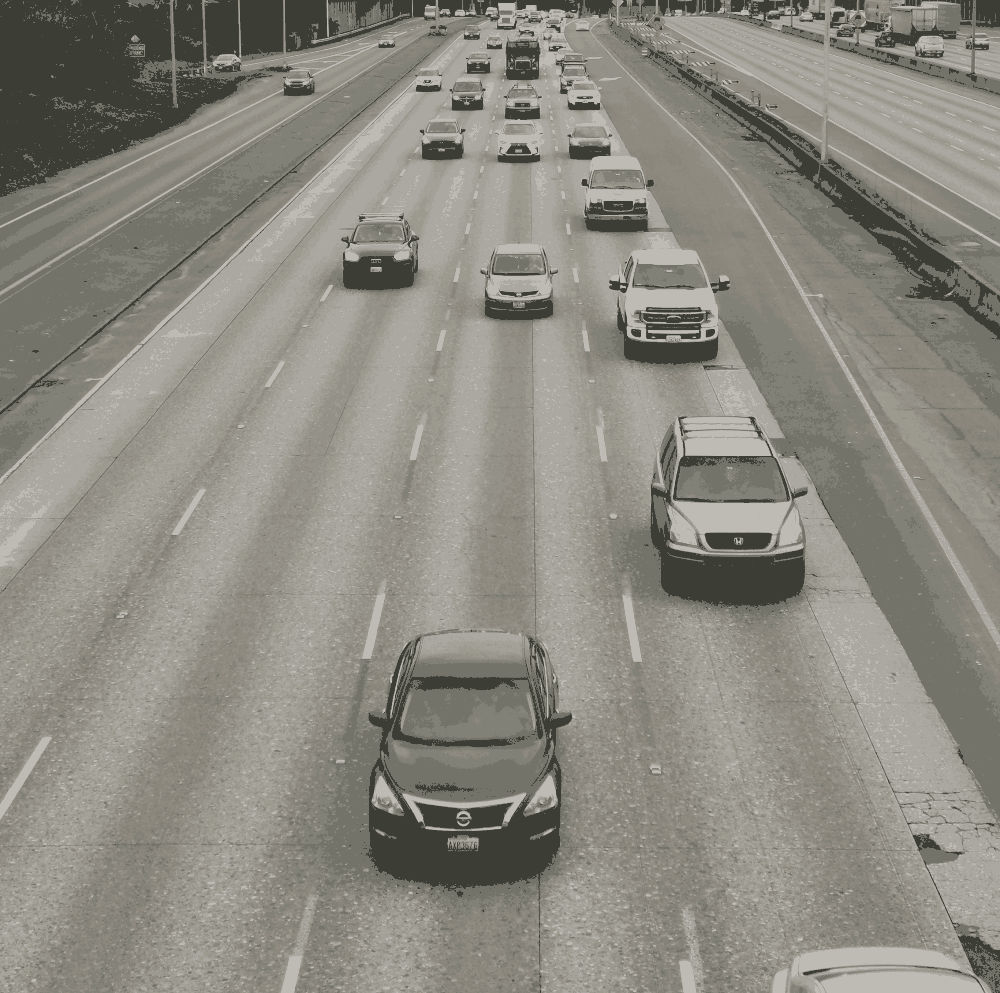

In [ ]:
result

### Save the result image with a new name

In [ ]:
result.save('/content/drive/MyDrive/Colab Notebooks/image/result30.png')

### Import ImageColor Module

In [ ]:
from PIL import ImageColor

### Retrieve 10 color values from the processed image and store them into np array.
### Revise your source file name in the code

In [ ]:
import numpy as np
from PIL import Image

# Open image
im2 = Image.open('/content/drive/MyDrive/Colab Notebooks/image/result30.png')

### We will convert the color mode again back to RGB
### Find the color names and the number of the color pixels

In [ ]:
# Convert Image to RGB and make into Numpy array
na = np.array(im2.convert('RGB')) 

# Get used colours and counts of each
colours, counts = np.unique(na.reshape(-1,3), axis=0, return_counts=1) 

### Print colours and counts

In [ ]:
colours, counts

(array([[ 60,  61,  52],
        [116, 115, 106],
        [130, 129, 120],
        [138, 134, 124],
        [142, 138, 128],
        [148, 145, 136],
        [156, 153, 143],
        [164, 161, 152],
        [170, 168, 160],
        [189, 187, 179]], dtype=uint8),
 array([718341, 860261, 776320, 550217, 651294, 855635, 892741, 789046,
        949642, 371151]))

### Convert rgb to hex

In [ ]:
def rgb_to_hex(rgb):
    return '#%02x%02x%02x' % rgb

In [ ]:
for i in range(colours.shape[0]): 
    print(colours[i], rgb_to_hex((colours[i,0],colours[i,1],colours[i,2])), counts[i])

[60 61 52] #3c3d34 718341
[116 115 106] #74736a 860261
[130 129 120] #828178 776320
[138 134 124] #8a867c 550217
[142 138 128] #8e8a80 651294
[148 145 136] #949188 855635
[156 153 143] #9c998f 892741
[164 161 152] #a4a198 789046
[170 168 160] #aaa8a0 949642
[189 187 179] #bdbbb3 371151


In [ ]:
myhex = []
for i in range(colours.shape[0]): 
    data= rgb_to_hex((colours[i,0],colours[i,1],colours[i,2]))
    myhex.append(data)
print(myhex)

['#3c3d34', '#74736a', '#828178', '#8a867c', '#8e8a80', '#949188', '#9c998f', '#a4a198', '#aaa8a0', '#bdbbb3']


### compute the color occupied area to get the percentage for each color in the next calculation and store them all in Pandas df

In [ ]:
totalpixel = sum(counts)
totalpixel

7414648

In [ ]:
import pandas as pd

In [ ]:
df = pd.DataFrame(columns=['date','colorhex','numpixel','percentage'],
                 index=[0,1,2,3,4,5,6,7,8,9])
df

,date,colorhex,numpixel,percentage
0,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN


revise date

In [ ]:
df['date']='02/09/2023 11:10'
df['colorhex']=myhex
df['numpixel']= np.int_(counts)
df['percentage']=(df.numpixel/totalpixel)*100;
df

,date,colorhex,numpixel,percentage
0,02/09/2023 11:10,#3c3d34,718341,9.688134
1,02/09/2023 11:10,#74736a,860261,11.602183
2,02/09/2023 11:10,#828178,776320,10.470086
3,02/09/2023 11:10,#8a867c,550217,7.420676
4,02/09/2023 11:10,#8e8a80,651294,8.783883
5,02/09/2023 11:10,#949188,855635,11.539793
6,02/09/2023 11:10,#9c998f,892741,12.040234
7,02/09/2023 11:10,#a4a198,789046,10.641719
8,02/09/2023 11:10,#aaa8a0,949642,12.807648
9,02/09/2023 11:10,#bdbbb3,371151,5.005646


In [ ]:
import numpy as np
from PIL import Image

In [ ]:
df = pd.DataFrame(columns=['date','colorhex','numpixel','percentage'],
                 index=[0,1,2,3,4,5,6,7,8,9])

## The following code blocks are the actual execution for each image.
Since google drive does not include the dataset for the script below, it will return an error when you execute it as it is. Please replace it with your own image.  

## dec1sample image

In [ ]:
import datetime

def incre_by_three_min(inputDate):
  # giving the date format
  date_format = '%d/%m/%Y %H:%M'

  # formatting the date using strptime() function and subtracting 2 days from it
  date = datetime.datetime.strptime(inputDate, date_format) + datetime.timedelta(minutes=3)

  # Formatting the date
  date=date.strftime(date_format)
  return date

02/09/2023 09:53


In [ ]:
import numpy as np
from PIL import Image

frames = []
time = "02/09/2023 09:50"
for i in range(30):
  index = i + 1
  print(index)
  im2 = Image.open("/content/drive/MyDrive/Colab Notebooks/image/result" + str(index) + ".png")
  # Get palette and reshape into 3 columns
  palette = np.array(im2.getpalette(),dtype=np.uint8).reshape((256,3))

  # Convert Image to RGB and make into Numpy array
  na = np.array(im2.convert('RGB')) 

  # Get used colours and counts of each
  colours, counts = np.unique(na.reshape(-1,3), axis=0, return_counts=1) 

  myhex = []
  for i in range(colours.shape[0]): 
      data= rgb_to_hex((colours[i,0],colours[i,1],colours[i,2]))
      myhex.append(data)
      
  totalpixel = sum(counts)   

  df = pd.DataFrame(columns=['date','color','numpixel','percentage'],
                 index=[0,1,2,3,4,5,6,7,8,9])
  
  df['date']=time
  df['color']=myhex
  #df['color']=df['color'].apply(lambda x: "'" + str(x) + "'")
  df['numpixel']= np.int_(counts)
  df['percentage']=(df.numpixel/totalpixel)*100;
  df
  frames.append(df)
  print(time)
  time = incre_by_three_min(time)


1
02/09/2023 09:50
2
02/09/2023 09:53
3
02/09/2023 09:56
4
02/09/2023 09:59
5
02/09/2023 10:02
6
02/09/2023 10:05
7
02/09/2023 10:08
8
02/09/2023 10:11
9
02/09/2023 10:14
10
02/09/2023 10:17
11
02/09/2023 10:20
12
02/09/2023 10:23
13
02/09/2023 10:26
14
02/09/2023 10:29
15
02/09/2023 10:32
16
02/09/2023 10:35
17
02/09/2023 10:38
18
02/09/2023 10:41
19
02/09/2023 10:44
20
02/09/2023 10:47
21
02/09/2023 10:50
22
02/09/2023 10:53
23
02/09/2023 10:56
24
02/09/2023 10:59
25
02/09/2023 11:02
26
02/09/2023 11:05
27
02/09/2023 11:08
28
02/09/2023 11:11
29
02/09/2023 11:14
30
02/09/2023 11:17


In [ ]:
result = pd.concat(frames)
display(result)


,date,color,numpixel,percentage
0,02/09/2023 09:50,#464840,680761,9.528582
1,02/09/2023 09:50,#7a7770,928817,13.000612
2,02/09/2023 09:50,#85837e,828609,11.598005
3,02/09/2023 09:50,#8c8982,516416,7.228253
4,02/09/2023 09:50,#908d86,625593,8.756398
...,...,...,...,...
5,02/09/2023 11:17,#949188,855635,11.539793
6,02/09/2023 11:17,#9c998f,892741,12.040234
7,02/09/2023 11:17,#a4a198,789046,10.641719
8,02/09/2023 11:17,#aaa8a0,949642,12.807648


In [ ]:
result.to_csv(r'/content/drive/MyDrive/Colab Notebooks/image/image_process.csv')

In [ ]:
import numpy as np
from PIL import Image

# Open image
im2 = Image.open('C:/Users/oh/Documents/Geog495_Visualizaing Seattle/image/sky/resultd1.png')

# Get palette and reshape into 3 columns
palette = np.array(im2.getpalette(),dtype=np.uint8).reshape((256,3))

# Convert Image to RGB and make into Numpy array
na = np.array(im2.convert('RGB')) 

# Get used colours and counts of each
colours, counts = np.unique(na.reshape(-1,3), axis=0, return_counts=1) 

myhex = []
for i in range(colours.shape[0]): 
    data= rgb_to_hex((colours[i,0],colours[i,1],colours[i,2]))
    myhex.append(data)
    
totalpixel = sum(counts)   

df1 = pd.DataFrame(columns=['date','color','numpixel','percentage'],
                 index=[0,1,2,3,4,5,6,7,8,9])

df1['date']='02/09/2023 11:10'
df1['color']=myhex
#df1['color']=df1['color'].apply(lambda x: "'" + str(x) + "'")
df1['numpixel']= np.int_(counts)
df1['percentage']=(df1.numpixel/totalpixel)*100;
df1

C:\Users\oh\anaconda3\envs\myenv\lib\site-packages\PIL\Image.py:951: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


,date,color,numpixel,percentage
0,12/01/2021,#7691a8,12565,4.146249
1,12/01/2021,#8a9baa,53538,17.666683
2,12/01/2021,#97a5b2,88323,29.145176
3,12/01/2021,#a6afb9,93156,30.739989
4,12/01/2021,#b0b8c2,44444,14.665809
5,12/01/2021,#bac2ca,9523,3.142438
6,12/01/2021,#bdc0be,13,0.004290
7,12/01/2021,#c0c0bf,2,0.000660
8,12/01/2021,#c2c7cb,1366,0.450758
9,12/01/2021,#c3b9ad,115,0.037948


In [ ]:
# Open image
im2 = Image.open('C:/Users/oh/Documents/Geog495_Visualizaing Seattle/image/sky/resultd2.png')

# Get palette and reshape into 3 columns
palette = np.array(im2.getpalette(),dtype=np.uint8).reshape((256,3))

# Convert Image to RGB and make into Numpy array
na = np.array(im2.convert('RGB')) 

# Get used colours and counts of each
colours, counts = np.unique(na.reshape(-1,3), axis=0, return_counts=1) 

myhex = []
for i in range(colours.shape[0]): 
    data= rgb_to_hex((colours[i,0],colours[i,1],colours[i,2]))
    myhex.append(data)
    
totalpixel = sum(counts)   

df2 = pd.DataFrame(columns=['date','color','numpixel','percentage'],
                 index=[0,1,2,3,4,5,6,7,8])

df2['date']='12/02/2021'
df2['color']=myhex
#df2['color']=df2['color'].apply(lambda x: "'" + str(x) + "'")
df2['numpixel']= np.int_(counts)
df2['percentage']=(df2.numpixel/totalpixel)*100;
df2

C:\Users\oh\anaconda3\envs\myenv\lib\site-packages\PIL\Image.py:951: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


,date,color,numpixel,percentage
0,12/02/2021,#c9cdcf,3323,0.916803
1,12/02/2021,#d5d8da,29429,8.119353
2,12/02/2021,#d9dde1,9775,2.696887
3,12/02/2021,#dde0de,678,0.187058
4,12/02/2021,#dde2e6,27167,7.495275
5,12/02/2021,#e0dfe1,4,0.001104
6,12/02/2021,#e0e0de,137,0.037798
7,12/02/2021,#e6e9ec,208727,57.587011
8,12/02/2021,#f1f2f2,83215,22.958712


In [ ]:
# Open image
im2 = Image.open('C:/Users/oh/Documents/Geog495_Visualizaing Seattle/image/sky/resultd3.png')

# Get palette and reshape into 3 columns
palette = np.array(im2.getpalette(),dtype=np.uint8).reshape((256,3))

# Convert Image to RGB and make into Numpy array
na = np.array(im2.convert('RGB')) 

# Get used colours and counts of each
colours, counts = np.unique(na.reshape(-1,3), axis=0, return_counts=1) 

myhex = []
for i in range(colours.shape[0]): 
    data= rgb_to_hex((colours[i,0],colours[i,1],colours[i,2]))
    myhex.append(data)
    
totalpixel = sum(counts)   

df3 = pd.DataFrame(columns=['date','color','numpixel','percentage'],
                 index=[0,1,2,3,4,5,6,7,8,9])

df3['date']='12/03/2021'
df3['color']=myhex
#df3['color']=df3['color'].apply(lambda x: "'" + str(x) + "'")
df3['numpixel']= np.int_(counts)
df3['percentage']=(df3.numpixel/totalpixel)*100;
df3

C:\Users\oh\anaconda3\envs\myenv\lib\site-packages\PIL\Image.py:951: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


,date,color,numpixel,percentage
0,12/03/2021,#7796ab,47369,13.146187
1,12/03/2021,#7ba8c5,16182,4.490946
2,12/03/2021,#8a9aa6,31533,8.751266
3,12/03/2021,#8baac3,33681,9.347395
4,12/03/2021,#8c9ca6,25827,7.167696
5,12/03/2021,#92a5b6,179045,49.689863
6,12/03/2021,#99b3c3,26656,7.397766
7,12/03/2021,#b97a81,1,0.000278
8,12/03/2021,#bc7177,7,0.001943
9,12/03/2021,#e12425,24,0.006661


In [ ]:
# Open image
im2 = Image.open('C:/Users/oh/Documents/Geog495_Visualizaing Seattle/image/sky/resultd4.png')

# Get palette and reshape into 3 columns
palette = np.array(im2.getpalette(),dtype=np.uint8).reshape((256,3))

# Convert Image to RGB and make into Numpy array
na = np.array(im2.convert('RGB')) 

# Get used colours and counts of each
colours, counts = np.unique(na.reshape(-1,3), axis=0, return_counts=1) 

myhex = []
for i in range(colours.shape[0]): 
    data= rgb_to_hex((colours[i,0],colours[i,1],colours[i,2]))
    myhex.append(data)
    
totalpixel = sum(counts)   

df4 = pd.DataFrame(columns=['date','color','numpixel','percentage'],
                 index=[0,1,2,3,4])

df4['date']='12/04/2021'
df4['color']=myhex
#df4['color']=df4['color'].apply(lambda x: "'" + str(x) + "'")
df4['numpixel']= np.int_(counts)
df4['percentage']=(df4.numpixel/totalpixel)*100;
df4

C:\Users\oh\anaconda3\envs\myenv\lib\site-packages\PIL\Image.py:951: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


,date,color,numpixel,percentage
0,12/04/2021,#b0b7be,2952,1.026568
1,12/04/2021,#b5bcc4,101407,35.264640
2,12/04/2021,#bbc2ca,143847,50.023299
3,12/04/2021,#c2c9d0,38378,13.346084
4,12/04/2021,#c9d0d7,976,0.339407


In [ ]:
# Open image
im2 = Image.open('C:/Users/oh/Documents/Geog495_Visualizaing Seattle/image/sky/resultd5.png')

# Get palette and reshape into 3 columns
palette = np.array(im2.getpalette(),dtype=np.uint8).reshape((256,3))

# Convert Image to RGB and make into Numpy array
na = np.array(im2.convert('RGB')) 

# Get used colours and counts of each
colours, counts = np.unique(na.reshape(-1,3), axis=0, return_counts=1) 

myhex = []
for i in range(colours.shape[0]): 
    data= rgb_to_hex((colours[i,0],colours[i,1],colours[i,2]))
    myhex.append(data)
    
totalpixel = sum(counts)   

df5 = pd.DataFrame(columns=['date','color','numpixel','percentage'],
                 index=[0,1,2,3,4,5,6,7,8,9])

df5['date']='12/05/2021'
df5['color']=myhex
#df5['color']=df5['color'].apply(lambda x: "'" + str(x) + "'")
df5['numpixel']= np.int_(counts)
df5['percentage']=(df5.numpixel/totalpixel)*100;
df5

C:\Users\oh\anaconda3\envs\myenv\lib\site-packages\PIL\Image.py:951: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


,date,color,numpixel,percentage
0,12/05/2021,#7d92a0,119,0.032485
1,12/05/2021,#9bb3c9,16735,4.568423
2,12/05/2021,#a4adb4,95455,26.057889
3,12/05/2021,#abbbc9,92509,25.253672
4,12/05/2021,#b7c3cd,130952,35.748077
5,12/05/2021,#bdc0bd,246,0.067155
6,12/05/2021,#c0bfc3,2,0.000546
7,12/05/2021,#c1beb8,131,0.035761
8,12/05/2021,#c4c9cd,28966,7.907316
9,12/05/2021,#c6c4bc,1204,0.328675


In [ ]:
# Open image
im2 = Image.open('C:/Users/oh/Documents/Geog495_Visualizaing Seattle/image/sky/resultd6.png')

# Get palette and reshape into 3 columns
palette = np.array(im2.getpalette(),dtype=np.uint8).reshape((256,3))

# Convert Image to RGB and make into Numpy array
na = np.array(im2.convert('RGB')) 

# Get used colours and counts of each
colours, counts = np.unique(na.reshape(-1,3), axis=0, return_counts=1) 

myhex = []
for i in range(colours.shape[0]): 
    data= rgb_to_hex((colours[i,0],colours[i,1],colours[i,2]))
    myhex.append(data)
    
totalpixel = sum(counts)   

df6 = pd.DataFrame(columns=['date','color','numpixel','percentage'],
                 index=[0,1,2,3])

df6['date']='12/06/2021'
df6['color']=myhex
#df6['color']=df6['color'].apply(lambda x: "'" + str(x) + "'")
df6['numpixel']= np.int_(counts)
df6['percentage']=(df6.numpixel/totalpixel)*100;
df6

C:\Users\oh\anaconda3\envs\myenv\lib\site-packages\PIL\Image.py:951: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


,date,color,numpixel,percentage
0,12/06/2021,#bec8d4,18506,6.077504
1,12/06/2021,#c2ccd8,88970,29.218391
2,12/06/2021,#c7d1dd,110029,36.134319
3,12/06/2021,#cbd5e1,86995,28.569787


In [ ]:
# Open image
im2 = Image.open('C:/Users/oh/Documents/Geog495_Visualizaing Seattle/image/sky/resultd7.png')

# Get palette and reshape into 3 columns
palette = np.array(im2.getpalette(),dtype=np.uint8).reshape((256,3))

# Convert Image to RGB and make into Numpy array
na = np.array(im2.convert('RGB')) 

# Get used colours and counts of each
colours, counts = np.unique(na.reshape(-1,3), axis=0, return_counts=1) 

myhex = []
for i in range(colours.shape[0]): 
    data= rgb_to_hex((colours[i,0],colours[i,1],colours[i,2]))
    myhex.append(data)
    
totalpixel = sum(counts)   

df7 = pd.DataFrame(columns=['date','color','numpixel','percentage'],
                 index=[0,1,2,3,4,5,6,7])

df7['date']='12/07/2021'
df7['color']=myhex
#df7['color']=df7['color'].apply(lambda x: "'" + str(x) + "'")
df7['numpixel']= np.int_(counts)
df7['percentage']=(df7.numpixel/totalpixel)*100;
df7

C:\Users\oh\anaconda3\envs\myenv\lib\site-packages\PIL\Image.py:951: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


,date,color,numpixel,percentage
0,12/07/2021,#acb4be,3338,0.987717
1,12/07/2021,#b3bbc5,39040,11.551971
2,12/07/2021,#bbc3cd,48326,14.299706
3,12/07/2021,#c3cbd4,53214,15.746070
4,12/07/2021,#cbd3db,60236,17.823886
5,12/07/2021,#d2dae3,80915,23.942820
6,12/07/2021,#dbe4ec,44466,13.157529
7,12/07/2021,#e0e9f1,8416,2.490302


In [ ]:
# Open image
im2 = Image.open('C:/Users/oh/Documents/Geog495_Visualizaing Seattle/image/sky/resultd8.png')

# Get palette and reshape into 3 columns
palette = np.array(im2.getpalette(),dtype=np.uint8).reshape((256,3))

# Convert Image to RGB and make into Numpy array
na = np.array(im2.convert('RGB')) 

# Get used colours and counts of each
colours, counts = np.unique(na.reshape(-1,3), axis=0, return_counts=1) 

myhex = []
for i in range(colours.shape[0]): 
    data= rgb_to_hex((colours[i,0],colours[i,1],colours[i,2]))
    myhex.append(data)
    
totalpixel = sum(counts)   

df8 = pd.DataFrame(columns=['date','color','numpixel','percentage'],
                 index=[0,1,2,3,4])

df8['date']='12/08/2021'
df8['color']=myhex
#df8['color']=df8['color'].apply(lambda x: "'" + str(x) + "'")
df8['numpixel']= np.int_(counts)
df8['percentage']=(df8.numpixel/totalpixel)*100;
df8

C:\Users\oh\anaconda3\envs\myenv\lib\site-packages\PIL\Image.py:951: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


,date,color,numpixel,percentage
0,12/08/2021,#d5e9f4,70475,21.469851
1,12/08/2021,#def0f9,3167,0.964810
2,12/08/2021,#e6ecec,24451,7.448873
3,12/08/2021,#e7e7de,232,0.070678
4,12/08/2021,#f4f8f7,229926,70.045788


In [ ]:
# Open image
im2 = Image.open('C:/Users/oh/Documents/Geog495_Visualizaing Seattle/image/sky/resultd9.png')

# Get palette and reshape into 3 columns
palette = np.array(im2.getpalette(),dtype=np.uint8).reshape((256,3))

# Convert Image to RGB and make into Numpy array
na = np.array(im2.convert('RGB')) 

# Get used colours and counts of each
colours, counts = np.unique(na.reshape(-1,3), axis=0, return_counts=1) 

myhex = []
for i in range(colours.shape[0]): 
    data= rgb_to_hex((colours[i,0],colours[i,1],colours[i,2]))
    myhex.append(data)
    
totalpixel = sum(counts)   

df9 = pd.DataFrame(columns=['date','color','numpixel','percentage'],
                 index=[0,1,2,3,4,5,6,7,8,9])

df9['date']='12/09/2021'
df9['color']=myhex
#df9['color']=df9['color'].apply(lambda x: "'" + str(x) + "'")
df9['numpixel']= np.int_(counts)
df9['percentage']=(df9.numpixel/totalpixel)*100;
df9

C:\Users\oh\anaconda3\envs\myenv\lib\site-packages\PIL\Image.py:951: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


,date,color,numpixel,percentage
0,12/09/2021,#9eb0c1,37,0.011199
1,12/09/2021,#aab9cb,49344,14.935890
2,12/09/2021,#b3cfe7,8443,2.555604
3,12/09/2021,#b7c5d5,86685,26.238604
4,12/09/2021,#c1cddc,15889,4.809427
5,12/09/2021,#c6d1dd,10647,3.222731
6,12/09/2021,#cbd8e6,76981,23.301309
7,12/09/2021,#d9e4f1,42402,12.834623
8,12/09/2021,#e2ecf7,27702,8.385093
9,12/09/2021,#eaf2f9,12242,3.705520


In [ ]:
# Open image
im2 = Image.open('C:/Users/oh/Documents/Geog495_Visualizaing Seattle/image/sky/resultd10.png')

# Get palette and reshape into 3 columns
palette = np.array(im2.getpalette(),dtype=np.uint8).reshape((256,3))

# Convert Image to RGB and make into Numpy array
na = np.array(im2.convert('RGB')) 

# Get used colours and counts of each
colours, counts = np.unique(na.reshape(-1,3), axis=0, return_counts=1) 

myhex = []
for i in range(colours.shape[0]): 
    data= rgb_to_hex((colours[i,0],colours[i,1],colours[i,2]))
    myhex.append(data)
    
totalpixel = sum(counts)   

df10 = pd.DataFrame(columns=['date','color','numpixel','percentage'],
                 index=[0,1,2,3,4,5,6,7,8,9])

df10['date']='12/10/2021'
df10['color']=myhex
#df10['color']=df10['color'].apply(lambda x: "'" + str(x) + "'")
df10['numpixel']= np.int_(counts)
df10['percentage']=(df10.numpixel/totalpixel)*100;
df10

C:\Users\oh\anaconda3\envs\myenv\lib\site-packages\PIL\Image.py:951: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


,date,color,numpixel,percentage
0,12/10/2021,#9eacba,1944,0.580493
1,12/10/2021,#a1aebb,5076,1.515731
2,12/10/2021,#a5b2bd,6283,1.876150
3,12/10/2021,#aeb9c5,32435,9.685328
4,12/10/2021,#bac4cf,57193,17.078247
5,12/10/2021,#c3ccd6,72206,21.561238
6,12/10/2021,#cad3dc,84185,25.138255
7,12/10/2021,#d2dae2,69354,20.709610
8,12/10/2021,#d9e1e8,6067,1.811650
9,12/10/2021,#e0e6ec,145,0.043298


## Once you process all the images and retrieve the required information, you will combine all the data and feed it into the chart code. 

In [ ]:
frames = [df1, df2, df3, df4, df5, df6, df7, df8, df9, df10]
  
result = pd.concat(frames)
display(result)

,date,color,numpixel,percentage
0,12/01/2021,#7691a8,12565,4.146249
1,12/01/2021,#8a9baa,53538,17.666683
2,12/01/2021,#97a5b2,88323,29.145176
3,12/01/2021,#a6afb9,93156,30.739989
4,12/01/2021,#b0b8c2,44444,14.665809
...,...,...,...,...
5,12/10/2021,#c3ccd6,72206,21.561238
6,12/10/2021,#cad3dc,84185,25.138255
7,12/10/2021,#d2dae2,69354,20.709610
8,12/10/2021,#d9e1e8,6067,1.811650


## Making a chart